In [112]:
import os
import pandas as pd
import numpy as np
import seaborn as sns
import PIL
from collections import defaultdict
import matplotlib.pyplot as plt
import random
from sklearn.model_selection import train_test_split
import shutil
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Dropout, Dense
from keras.layers import BatchNormalization, Activation, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau
from livelossplot import PlotLossesKeras
from sklearn.metrics import confusion_matrix, classification_report

In [75]:
base = '/kaggle/input/hand-gesture-recognition-dataset-one-hand/Dataset_RGB/Dataset_RGB'

In [76]:
st = {}
for i in os.listdir(base):
    st[i] = len(os.listdir(os.path.join(base, i)))

In [77]:
count = pd.DataFrame(st.values(), index=st.keys())
count.columns=['count']

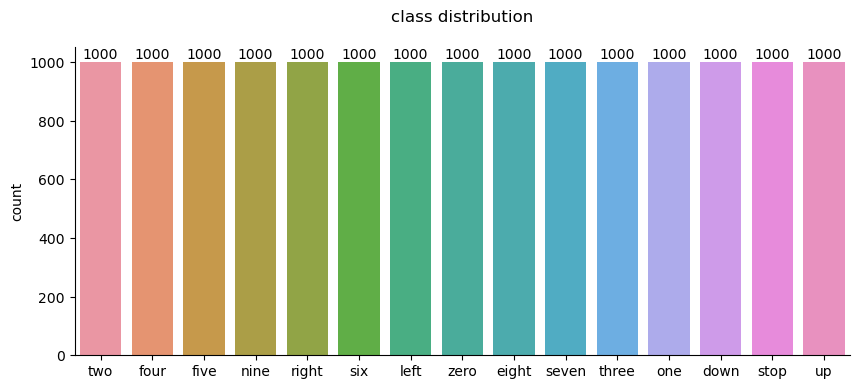

In [78]:
sns.barplot(count,x=count.index, y='count')
fig = plt.gcf()
fig.set_size_inches(10,4)
ax = plt.gca()
for i in ax.containers:
    plt.bar_label(i)
plt.title('class distribution\n')
ax.spines[['top','right']].set_visible(False);

### take a look at the images

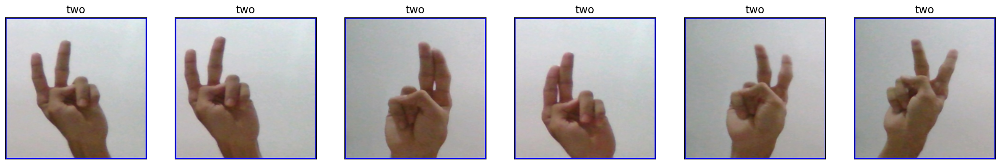

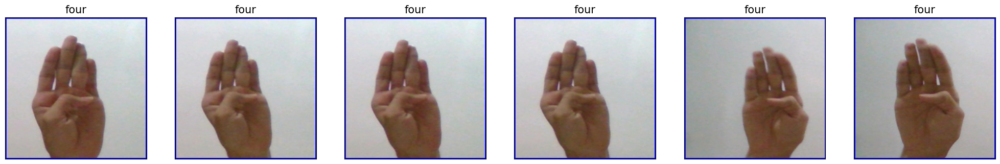

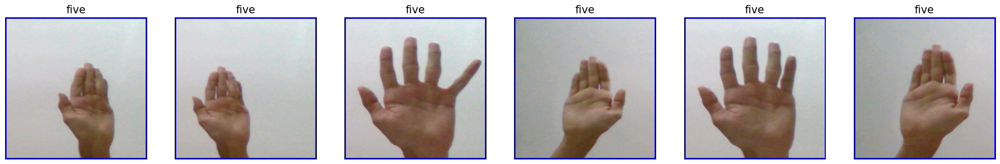

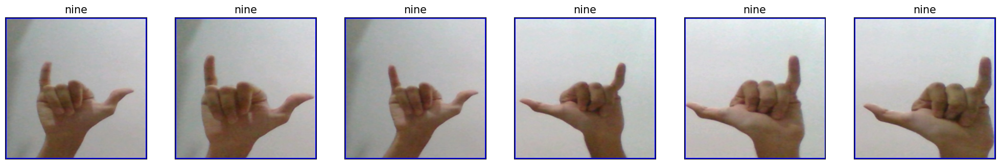

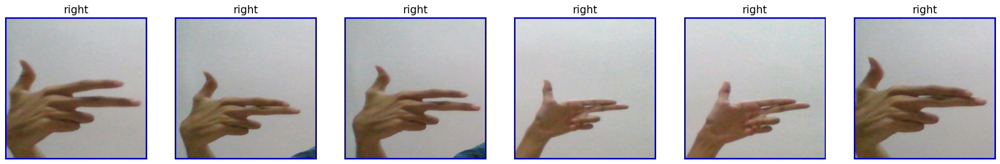

...

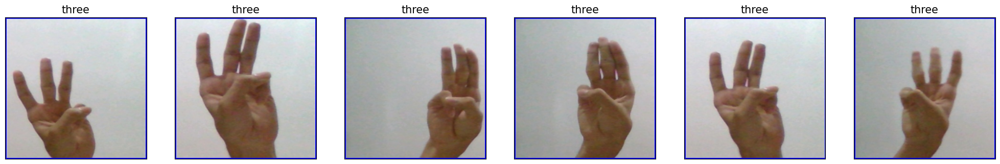

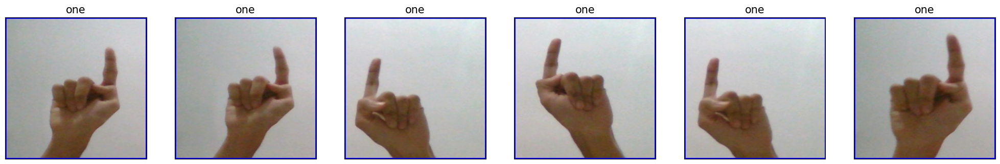

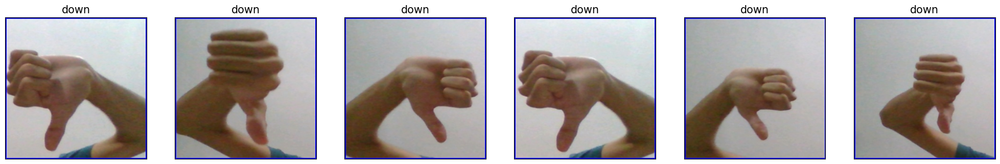

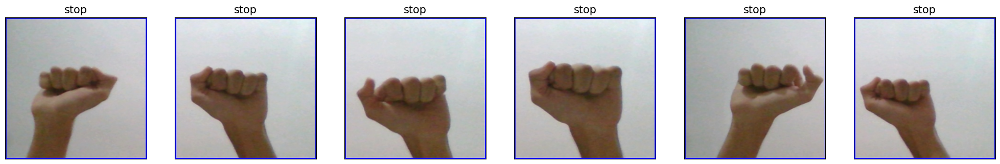

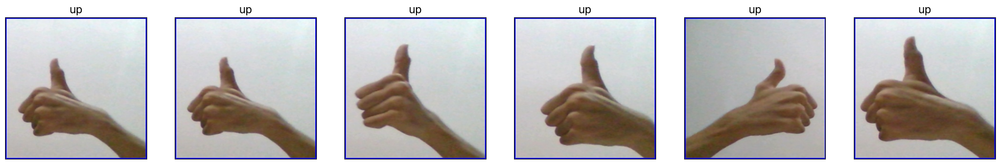

In [79]:
for i in os.listdir(base):
    imgs = os.listdir(os.path.join(base, i))
    sample_imgs = random.sample(imgs, 6)
    
    fig, axes = plt.subplots(1,6, figsize=(25,4), subplot_kw=dict(xticks=[], yticks=[]))
    for num, ax in enumerate(axes.flat):
        ax.imshow(plt.imread(os.path.join(base, i, sample_imgs[num])))
        ax.set_title(i, size=15)

### split the dataset

In [80]:
def make_dir(path):
    if not os.path.exists(path):
        os.mkdir(path)

In [81]:
output_dir = '/kaggle/working'

In [82]:
train_dir = os.path.join(output_dir, 'train')
val_dir = os.path.join(output_dir, 'val')
test_dir = os.path.join(output_dir, 'test')

In [91]:
for i in os.listdir(base):
    for j in ['train', 'val','test']:
        make_dir(os.path.join(j,i))

In [57]:
make_dir(train_dir)
make_dir(val_dir)
make_dir(test_dir)

In [93]:
for i in os.listdir(base):
    total_imgs = os.listdir(os.path.join(base, i))
    Xtrain, Xvaltest = train_test_split(total_imgs, test_size=0.3)
    Xval, Xtest = train_test_split(Xvaltest, test_size=0.5)
    for tr in Xtrain:
        shutil.copy(os.path.join(base, i, tr), os.path.join(train_dir, i, tr))
    for v in Xval:
        shutil.copy(os.path.join(base, i, v), os.path.join(val_dir, i, v))
    for te in Xtest:
        shutil.copy(os.path.join(base, i, te), os.path.join(test_dir, i, te))

In [109]:
for i in os.listdir(base):
    print(f'there are {len(os.listdir(os.path.join(train_dir, i)))} images in the train dataset for class [{i}]')
    print(f'there are {len(os.listdir(os.path.join(val_dir, i)))} images in the val dataset for class [{i}]')
    print(f'there are {len(os.listdir(os.path.join(test_dir, i)))} images in the test dataset for class [{i}]\n')

there are 700 images in the train dataset for class [two]
there are 150 images in the val dataset for class [two]
there are 150 images in the test dataset for class [two]

there are 700 images in the train dataset for class [four]
there are 150 images in the val dataset for class [four]
there are 150 images in the test dataset for class [four]

there are 700 images in the train dataset for class [five]
there are 150 images in the val dataset for class [five]
there are 150 images in the test dataset for class [five]

there are 700 images in the train dataset for class [nine]
there are 150 images in the val dataset for class [nine]
there are 150 images in the test dataset for class [nine]

there are 700 images in the train dataset for class [right]
there are 150 images in the val dataset for class [right]
there are 150 images in the test dataset for class [right]

there are 700 images in the train dataset for class [six]
there are 150 images in the val dataset for class [six]
there are 1

### build the model

In [113]:
train_generator = ImageDataGenerator(rescale=1.0 / 255, 
                                     horizontal_flip=True, 
                                     zoom_range=0.1, 
                                     shear_range=0.2, 
                                     width_shift_range=0.1,
                                     height_shift_range=0.1, 
                                     rotation_range=4, 
                                     vertical_flip=False)

validation_generator = ImageDataGenerator(rescale=1./255)

test_generator = ImageDataGenerator(rescale=1./255)

In [114]:
train_data_gen = train_generator.flow_from_directory(train_dir, 
                                                     class_mode='categorical', 
                                                     target_size=(48,48),
                                                     batch_size=32,shuffle=True)

validation_data_gen = validation_generator.flow_from_directory(val_dir, 
                                                     class_mode='categorical', 
                                                     target_size=(48,48),
                                                     batch_size=32,shuffle=False)

test_data_gen = test_generator.flow_from_directory(test_dir, 
                                                     class_mode='categorical', 
                                                     target_size=(48,48),
                                                     batch_size=32,shuffle=False)

Found 10500 images belonging to 15 classes.
Found 2250 images belonging to 15 classes.
Found 2250 images belonging to 15 classes.


In [118]:
model = Sequential()
model.add(Conv2D(filters = 64, kernel_size = 3,  padding='same', activation = 'relu', input_shape = (48,48,3)))
model.add(MaxPooling2D(pool_size = 2))
model.add(Conv2D(filters = 64, kernel_size = 3,  padding='same', activation = 'relu'))
model.add(MaxPooling2D(pool_size = 2))
model.add(Conv2D(filters = 256, kernel_size = 3,  padding='same', activation = 'relu'))
model.add(MaxPooling2D(pool_size = 2))
model.add(Flatten())
model.add(Dense(units = 512, activation = 'relu'))
model.add(Dense(15,activation='softmax'))
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 48, 48, 64)        1792      
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 24, 24, 64)       0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 24, 24, 64)        36928     
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 12, 12, 64)       0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 12, 12, 256)       147712    
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 6, 6, 256)       

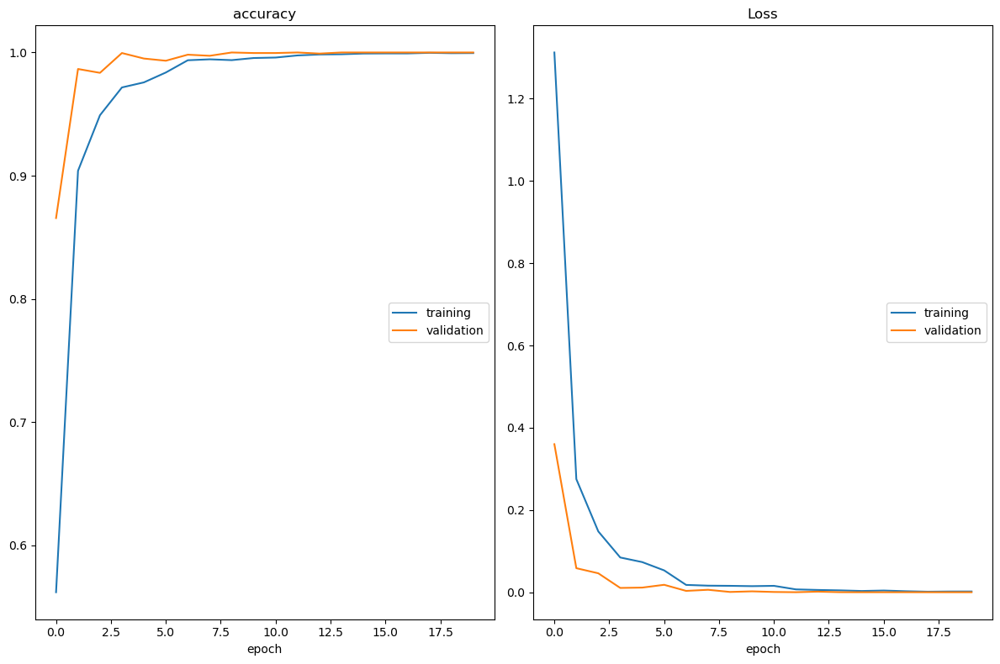

accuracy
	training         	 (min:    0.562, max:    1.000, cur:    1.000)
	validation       	 (min:    0.866, max:    1.000, cur:    1.000)
Loss
	training         	 (min:    0.001, max:    1.313, cur:    0.002)
	validation       	 (min:    0.000, max:    0.360, cur:    0.000)

Epoch 20: saving model to model_weights.h5
328/328 [==============================] - 72s 220ms/step - loss: 0.0019 - accuracy: 0.9995 - val_loss: 4.6596e-05 - val_accuracy: 1.0000 - lr: 3.1250e-05


In [119]:
epochs = 20
steps_per_epoch = train_data_gen.n//32
validation_steps = validation_data_gen.n//32

checkpoint = ModelCheckpoint('model_weights.h5', monitor='val_accuracy',save_weight_only=True, mode='max', verbose=1)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=2, min_lr=0.00001, mode='auto')
callbacks=[PlotLossesKeras(), checkpoint, reduce_lr]

history = model.fit(x=train_data_gen, 
                    steps_per_epoch = steps_per_epoch,
                    epochs=epochs,
                    validation_data=validation_data_gen, 
                    validation_steps=validation_steps,
                    callbacks=callbacks)

### test the model

In [120]:
model.evaluate(test_data_gen)

71/71 [==============================] - 4s 55ms/step - loss: 7.4662e-05 - accuracy: 1.0000


[7.466178067261353e-05, 1.0]

In [121]:
pred = model.predict(test_data_gen, test_data_gen.n//test_data_gen.batch_size)

71/71 [==============================] - 4s 52ms/step


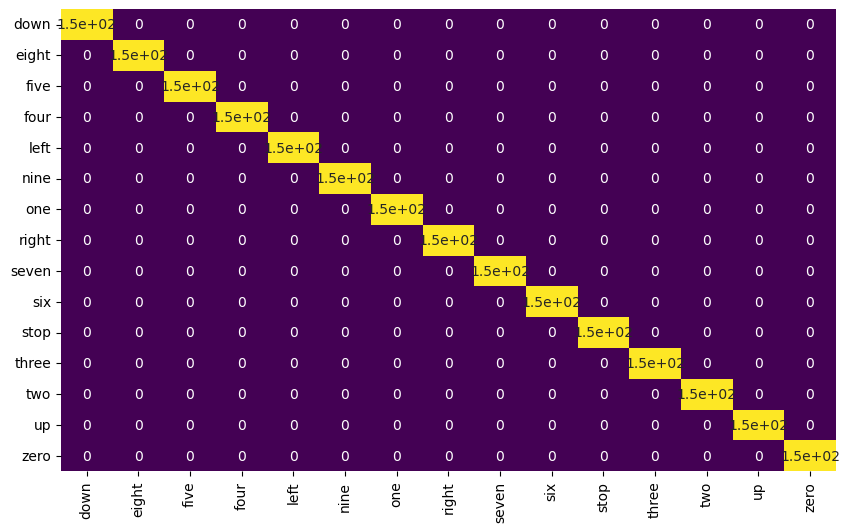

In [122]:
sns.heatmap(confusion_matrix(np.argmax(pred,axis=1), test_data_gen.classes), annot=True, 
            xticklabels=test_data_gen.class_indices.keys(),
           yticklabels=test_data_gen.class_indices.keys(), cbar=False, cmap='viridis')
fig=plt.gcf()
fig.set_size_inches(10,6);

In [123]:
print(classification_report(np.argmax(pred,axis=1), test_data_gen.classes))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       150
           1       1.00      1.00      1.00       150
           2       1.00      1.00      1.00       150
           3       1.00      1.00      1.00       150
           4       1.00      1.00      1.00       150
           5       1.00      1.00      1.00       150
           6       1.00      1.00      1.00       150
           7       1.00      1.00      1.00       150
           8       1.00      1.00      1.00       150
           9       1.00      1.00      1.00       150
          10       1.00      1.00      1.00       150
          11       1.00      1.00      1.00       150
          12       1.00      1.00      1.00       150
          13       1.00      1.00      1.00       150
          14       1.00      1.00      1.00       150

    accuracy                           1.00      2250
   macro avg       1.00      1.00      1.00      2250
weighted avg       1.00   

In [124]:
model_json = model.to_json()
with open('model_json', 'w') as json_file:
    json_file.write(model_json)

In [1]:
gesture = {0: '下面', 1: '八', 2: '五', 3: '四', 4: '左', 5: '九', 6: '一', 7: '右', 8: '七', 9: '六', 10: '停下', 11: '三', 12: '二',
         13: '上面', 14: '零'}

In [2]:
gesture.get(1)

'八'